# DESeq2

## STEP 0. Loading the Libraries and Setting the Working Path

Clean env and import libraries

In [1]:
rm(list = ls())

Import libraries 

In [2]:
suppressMessages(library(DESeq2))
suppressMessages(library(ggplot2))
suppressMessages(library(gplots))
suppressMessages(library(plotly))
suppressMessages(library(RColorBrewer))

Set the working dir

In [3]:
setwd('demo_data/')

## STEP 1. Loading the Sample Sheet and Read Counts

Load sample sheet metadata

In [4]:
sample_sheet_file <- 'sample_sheet.csv'
sample_sheet <- read.table(sample_sheet_file, header = T, sep = ',', row.names = 1)

Check the loaded metadata

In [5]:
head(sample_sheet)
dim(sample_sheet)

,name,treatment,stage
,<fct>,<fct>,<fct>
control_early_01,DB_A_Index_702_502,control,early_instar
control_early_02,DB_A_Index_711_504,control,early_instar
control_early_03,DB_B_Index_708_507,control,early_instar
control_embryo_01,DB_A_Index_703_501,control,embryo
control_embryo_02,DB_A_Index_712_503,control,embryo
control_embryo_03,DB_B_Index_709_506,control,embryo


[1] 18  3

Set Control as default reference condition

In [6]:
sample_sheet$treatment <- relevel(sample_sheet$treatment, ref = 'control')
sample_sheet$stage <- relevel(sample_sheet$stage, ref = 'embryo')

Load read counts

In [7]:
raw_counts_file <- 'raw_read_counts.tsv'
raw_counts <- read.table(raw_counts_file, header = T, sep = '\t', row.names = 1, check.names = F)

Check the loaded values

In [8]:
head(raw_counts)
dim(raw_counts)

,control_early_01,control_early_02,control_early_03,control_embryo_01,control_embryo_02,control_embryo_03,control_late_01,control_late_02,control_late_03,treatment_early_01,treatment_early_02,treatment_early_03,treatment_embryo_01,treatment_embryo_02,treatment_embryo_03,treatment_late_01,treatment_late_02,treatment_late_03
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
JGI_V11_100009,42.338585,41.90032,26.478301,13.983145,31.97939,52.106526,37.703746,20.75900,27.786410,33.269395,48.969836,40.818971,41.221613,66.016698,33.463596,25.97646,44.074467,17.502796
JGI_V11_100036,213.921273,395.43427,191.967684,151.484075,456.23935,582.233795,133.219902,496.14015,419.111678,304.177325,184.749837,269.858754,426.764930,728.628746,646.265702,247.95708,275.465420,172.527558
JGI_V11_100044,0.000000,5.23754,0.000000,0.000000,2.13196,2.265501,0.000000,2.07590,2.315534,0.000000,4.451803,0.000000,4.849601,4.890126,23.006222,0.00000,8.263963,2.500399
JGI_V11_100045,15.598426,15.71262,2.206525,0.000000,29.84743,4.531002,10.054332,4.15180,6.946602,33.269395,8.903607,4.535441,9.699203,12.225315,25.097697,0.00000,2.754654,5.000799
JGI_V11_100062,2.228347,0.00000,0.000000,0.000000,2.13196,0.000000,2.513583,2.07590,9.262137,4.752771,0.000000,6.803162,2.424801,2.445063,2.091475,0.00000,2.754654,2.500399
JGI_V11_100066,11.141733,49.75663,50.750077,4.661048,29.84743,20.389510,22.622248,53.97341,55.572819,30.893010,26.710820,22.677206,58.195218,80.687076,83.658990,54.31441,122.752770,30.004793


[1] 18347    18

Convert to a matrix (and round to integer)

In [9]:
raw_counts <- as.matrix(raw_counts)
raw_counts <- round(raw_counts)

[**OPTIONAL**] Take subset if necessary

In [ ]:
sample_sheet <- sample_sheet[sample_sheet$stage %in% c('early_instar', 'late_instar'),]

Match the order of sample sheet and read counts

In [10]:
match_index <- match(row.names(sample_sheet), colnames(raw_counts))
raw_counts <- raw_counts[,match_index]

Or alternatively 

In [ ]:
match_index <- match(colnames(raw_counts), row.names(sample_sheet))
sample_sheet <- sample_sheet[match_index,]

Check if there are any missing samples

In [11]:
stopifnot(length(match_index) > 0)
stopifnot(row.names(sample_sheet) == colnames(raw_counts))
stopifnot(!any(is.na(row.names(sample_sheet))))
stopifnot(!any(is.na(colnames(raw_counts))))

In [12]:
dim(raw_counts)

[1] 18347    18

## STEP 2. Checking the Data Quality

Plot the count distribution over samples

In [13]:
df <- data.frame(
  sample = row.names(sample_sheet), 
  num.counts = colSums(raw_counts), 
  null.counts = colSums(raw_counts == 0) / dim(raw_counts)[1]*100, 
  treatment = sample_sheet$treatment
)

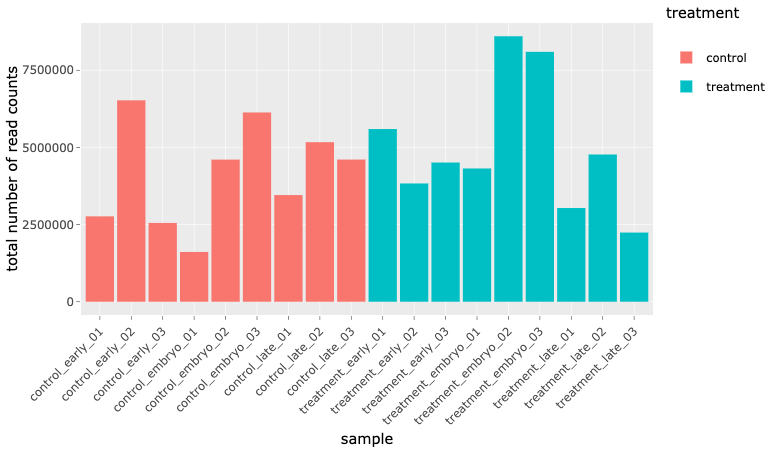

In [14]:
p <- ggplot(df, aes(x = sample, y = num.counts, fill = treatment)) +
  geom_bar(stat = 'identity') + ylab('total number of read counts') + #scale_fill_manual(values = c('#619CFF', '#F564E3')) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))
ggplotly(p)

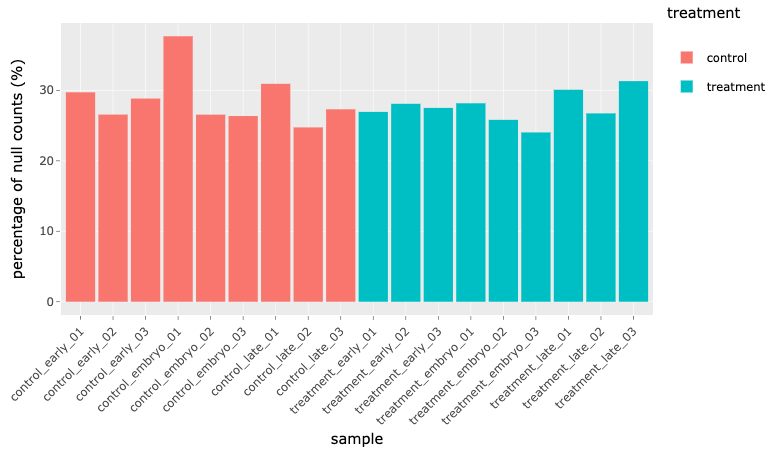

In [15]:
p <- ggplot(df, aes(x = sample, y = null.counts, fill = treatment)) +
  geom_bar(stat = 'identity') + ylab('percentage of null counts (%)') + #scale_fill_manual(values = c('#619CFF', '#F564E3')) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))
ggplotly(p)

Remove samples with high null counts

In [16]:
rm.samples <- row.names(df[df$null.counts >= 75,])
rm.samples

character(0)

In [17]:
raw_counts <- raw_counts[,!(row.names(sample_sheet) %in% rm.samples)]
sample_sheet <- sample_sheet[!(row.names(sample_sheet) %in% rm.samples),]
stopifnot(row.names(sample_sheet) == colnames(raw_counts))
dim(raw_counts)

[1] 18347    18

Remove low / zero variance genes

In [18]:
read_vars <- rowVars(raw_counts)
raw_counts <- raw_counts[which(read_vars > 1e-10),]
dim(raw_counts)

[1] 16662    18

Remove genes with too many null counts

In [19]:
read_valids <- rowSums(raw_counts != 0)
raw_counts <- raw_counts[which(read_valids > 3),]
dim(raw_counts)

[1] 14760    18

Remove genes with too small total counts

In [20]:
read_cnts <- rowSums(raw_counts)
raw_counts <- raw_counts[which(read_cnts > 200),]
dim(raw_counts)

[1] 10902    18

## STEP 3. Applying DESeq2 Differential Analysis

Pack data into dataset object (dds)

In [21]:
dds <- DESeqDataSetFromMatrix(raw_counts, colData = sample_sheet, design = ~treatment*stage)

converting counts to integer mode



Apply DESeq2 model fitting

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



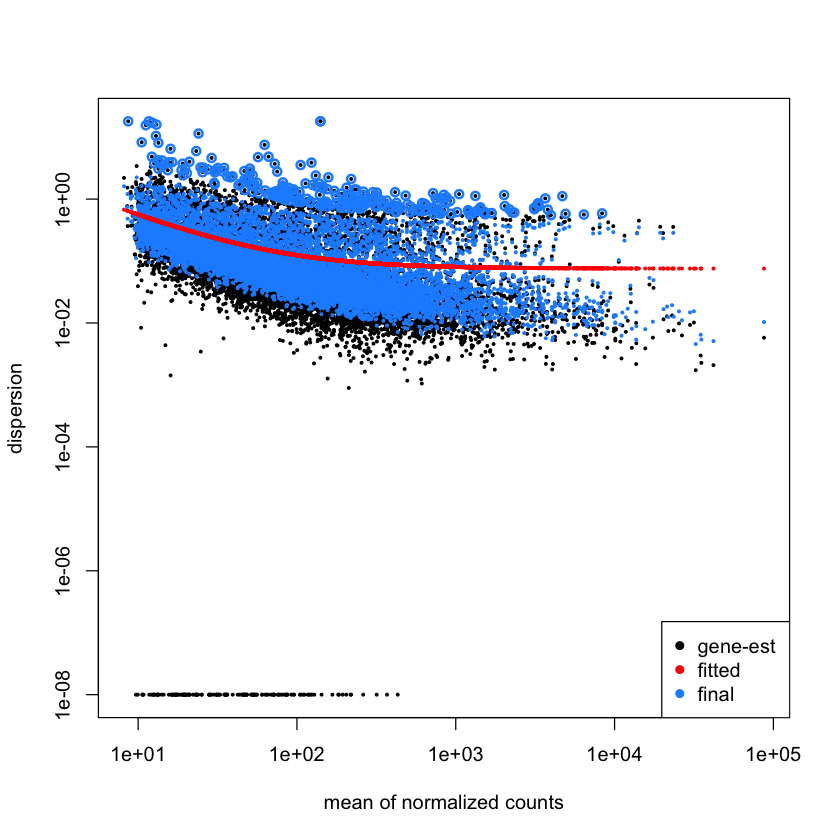

In [22]:
dds <- DESeq(dds)
plotDispEsts(dds)

Print available DESeq2 results

In [23]:
resultsNames(dds)[-1]

[1] "treatment_treatment_vs_control"      
[2] "stage_early_instar_vs_embryo"        
[3] "stage_late_instar_vs_embryo"         
[4] "treatmenttreatment.stageearly_instar"
[5] "treatmenttreatment.stagelate_instar"

In [24]:
res <- results(dds, name = 'treatment_treatment_vs_control')

Or alternatively 

In [25]:
res <- results(dds, contrast = c('stage', 'early_instar', 'late_instar'))

Number of DEGs (adjusted p-values < 0.05)

In [26]:
cat(paste0('significant p-values = ', sum(res$pvalue < 0.05, na.rm = T), '\n'))
cat(paste0('significant p-adjust = ', sum(res$padj < 0.05, na.rm = T), '\n'))

significant p-values = 2359
significant p-adjust = 1167


## STEP 4. Obtaining Transformed Read Counts

Obtain the normalised read counts

In [27]:
norm_counts <- counts(dds, normalized = T) 

Obtain vst transformed read counts

In [28]:
vds <- varianceStabilizingTransformation(dds)
vst_counts <- as.matrix(assay(vds))

Obtain rlog transformed read counts

In [29]:
rds <- rlog(dds)
log_counts <- as.matrix(assay(rds))

## STEP 5. Results Visualisation

PCA plot (pick the outliers and re-fit the DESeq model)

In [30]:
pca.plot <- function(read.counts, classes, 
                     comps = c(1, 2), ntop = min(500, nrow(read.counts)), standard = T,
                     col = c('lightblue', 'orange', 'MediumVioletRed', 'SpringGreen')){
  top_index <- order(rowVars(read.counts), decreasing = TRUE)[1:ntop]
  pca <- prcomp(scale(t(read.counts[top_index,]), center = standard, scale = standard))
  prp <- pca$sdev^2 * 100 / sum(pca$sdev^2)
  
  pca_comps <- pca$x[,comps]
  prp_comps <- round(prp[comps], 2)

  df <- data.frame(pc1 = pca_comps[,1], pc2 = pca_comps[,2], condition = classes)
  p  <- ggplot(df, aes(x = pc1, y = pc2, color = condition)) + 
        geom_point(size = 3) + 
        labs(title = paste0('Principal Component Analysis - Axes ', comps[1] , ' and ', comps[2]), 
             x = paste0('PC', comps[1], ' (', prp_comps[1], '%)'), 
             y = paste0('PC', comps[2], ' (', prp_comps[2], '%)')) + 
        geom_text(label = colnames(read.counts)) +
        scale_color_manual(values = col)
  return(p)
}

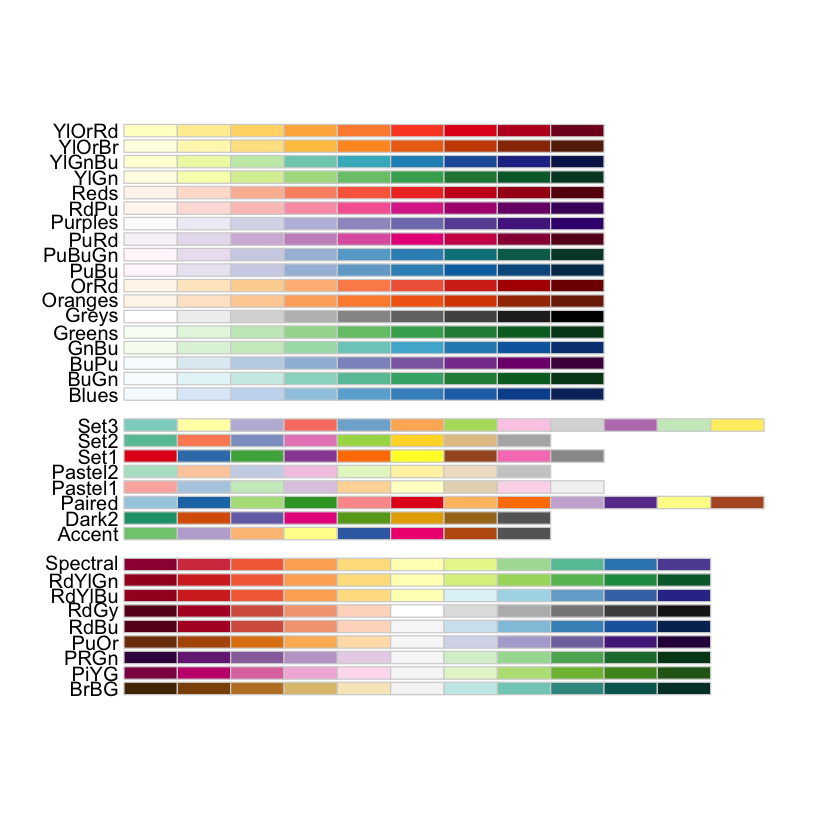

In [31]:
display.brewer.all()

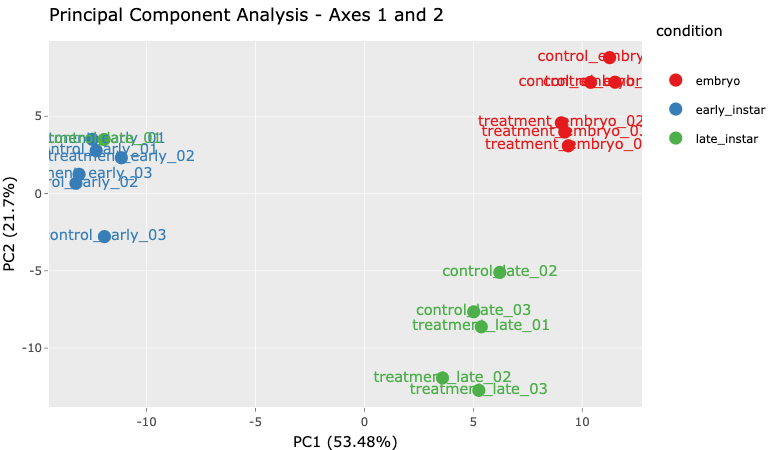

In [32]:
# conds <- as.factor(paste0(sample_sheet$treatment, '-', sample_sheet$stage))
conds <- as.factor(sample_sheet$stage)

p <- pca.plot(norm_counts, conds, comps = c(1,2), ntop = 200, 
              col = brewer.pal(max(3, nlevels(conds)), 'Set1'))
ggplotly(p)

Plot the distribution of adjusted p-values

Warning message:
“Removed 21 rows containing non-finite values (stat_bin).”


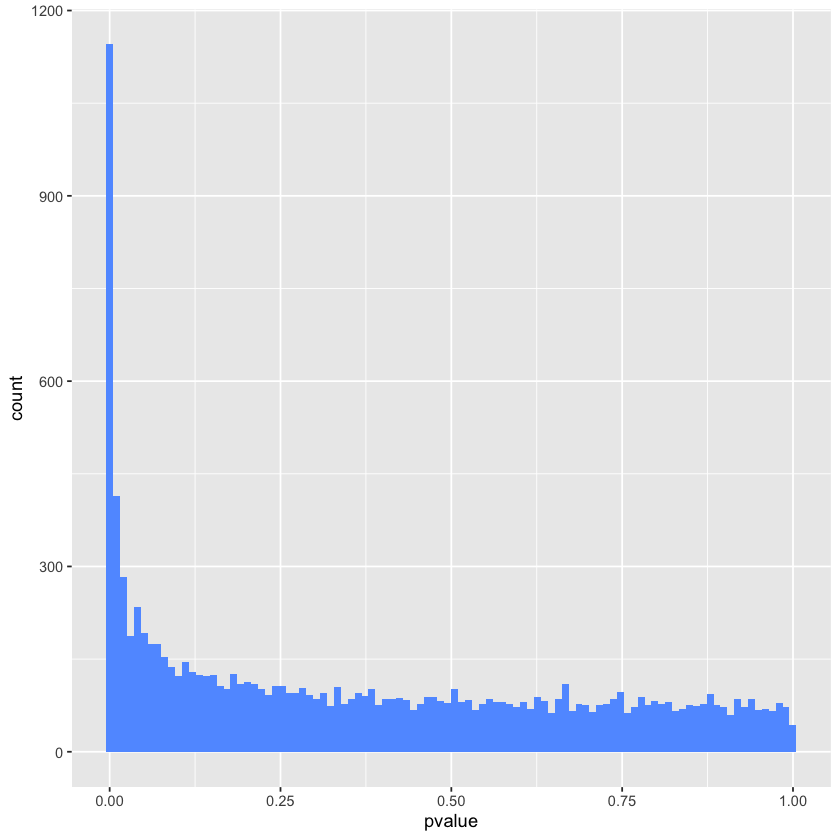

In [33]:
p <- ggplot(as.data.frame(res), aes(x = pvalue)) + geom_histogram(fill = '#619CFF', bins = 100)
p

MA-plot

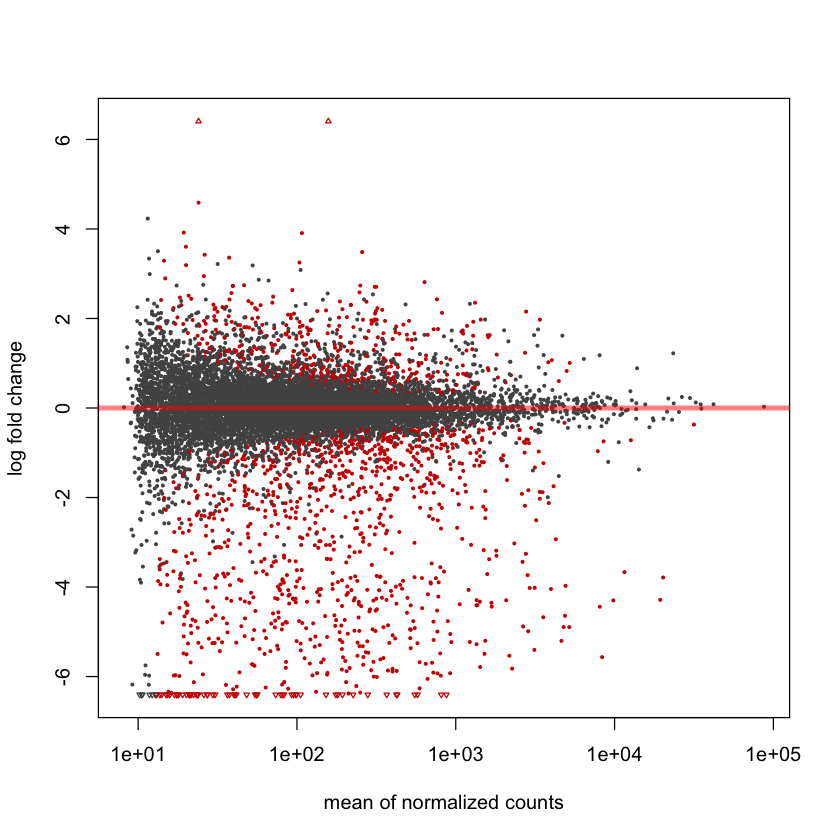

In [34]:
plotMA(res)

Plot the heatmap of significant genes

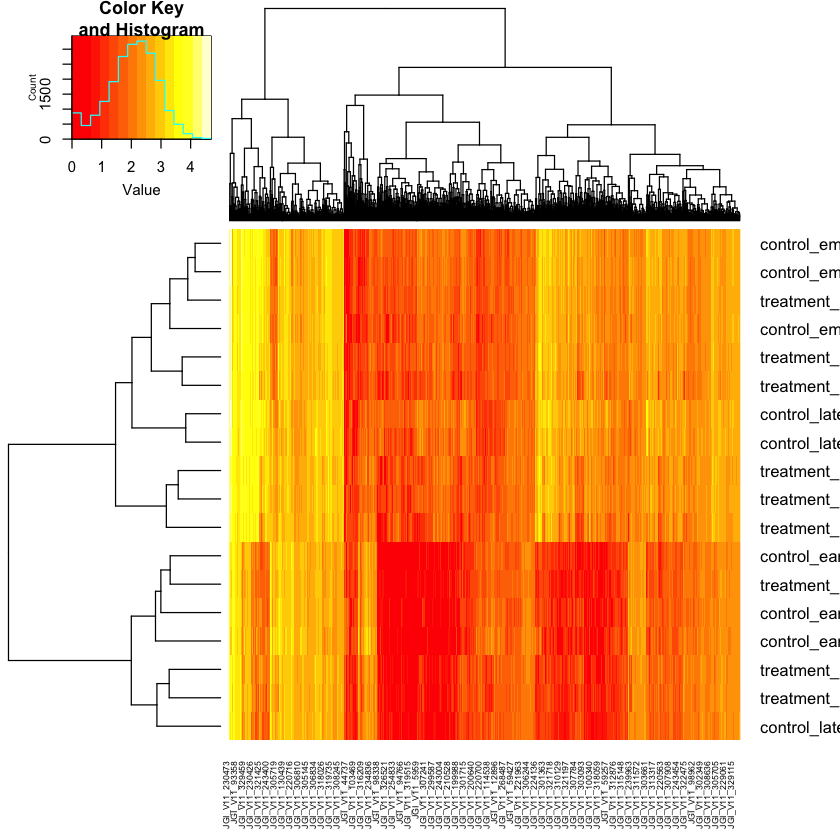

In [35]:
heatmap.2(t(log10(norm_counts+1)[which(res$padj < 0.05),]), trace='none')

Volcano plot

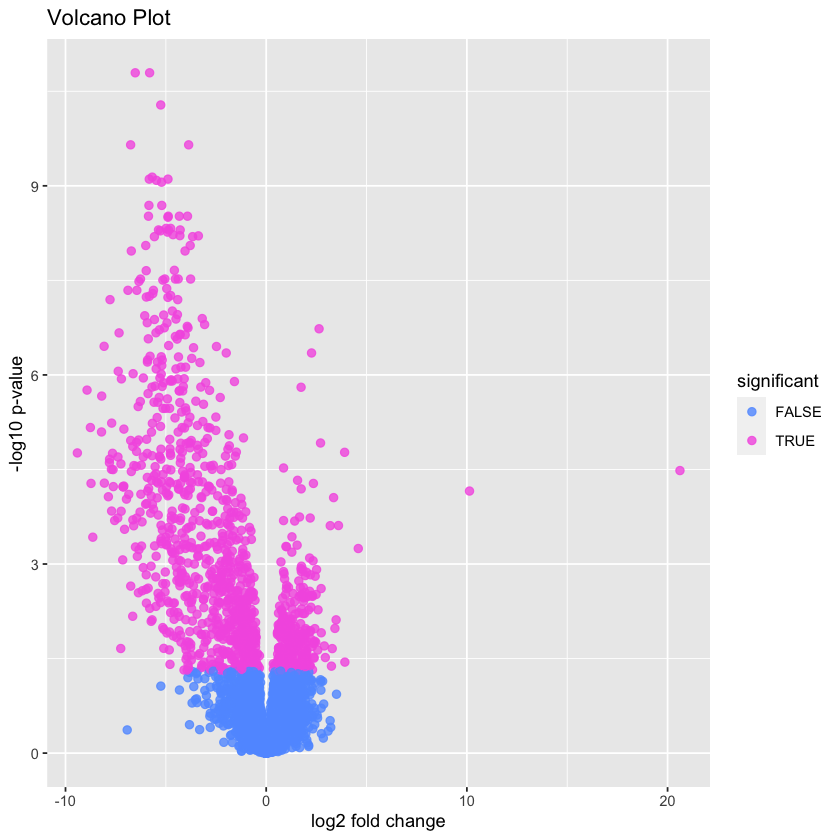

In [36]:
valid_index <- which(!is.na(res$padj))
df <- data.frame(
    pvals = res$padj[valid_index], 
    lfcs = res$log2FoldChange[valid_index], 
    gene = rownames(res)[valid_index]
)
df$significant = as.factor(df$pvals < 0.05) #& abs(df$lfcs) > 2)

p <- ggplot(df, aes(x = lfcs, y = -log10(pvals), colour = significant, gene = gene)) + 
  geom_point(alpha = 0.8, size = 2) +
  labs(title = 'Volcano Plot',x = 'log2 fold change', y = '-log10 p-value') +
  scale_color_manual(values = c('#619CFF', '#F564E3'))
p

## STEP 6. Saving Results to File

In [37]:
genes <- sort(row.names(dds))
res.table <- DataFrame(row.names = genes, log2FoldChange = res$log2FoldChange, pvalue = res$pvalue, padj = res$padj)

colnames(norm_counts) <- paste0('norm.', colnames(norm_counts))
colnames(vst_counts)  <- paste0('vst.',  colnames(vst_counts))
colnames(log_counts)  <- paste0('rlog.', colnames(log_counts))

res.table <- cbind(res.table, raw_counts[genes,], norm_counts[genes,], vst_counts[genes,], log_counts[genes,])
write.csv(res.table, file = paste0('DESeq2_results.csv'))